In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import pandas as pd
import random
from skimage import io
from shutil import copyfile
import sys
import time

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [2]:
pip install wget

Note: you may need to restart the kernel to use updated packages.


In [3]:
import wget
#url = 'https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv'
#filename = wget.download(url)

In [4]:
images_boxable_file = "D:/Users Data/User/Downloads/dataset/train-images-boxable-with-rotation.csv"
annotations_bbox_file = "D:/Users Data/User/Downloads/dataset/train-annotations-bbox.csv"
class_descriptions_file = "D:/Users Data/User/Downloads/dataset/class-descriptions-boxable.csv"

In [5]:
images_boxable = pd.read_csv(images_boxable_file)
images_boxable.head()

,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
0,4fa8054781a4c382,train,https://farm3.staticflickr.com/5310/5898076654...,https://www.flickr.com/photos/michael-beat/589...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/michael-beat/,Michael Beat,...die FNF-Kerze,4405052,KFukvivpCM5QXl5SqKe41g==,https://c1.staticflickr.com/6/5310/5898076654_...,0.0
1,b37f763ae67d0888,train,https://c1.staticflickr.com/1/67/197493648_628...,https://www.flickr.com/photos/drstarbuck/19749...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/drstarbuck/,Karen,Three boys on a hill,494555,9IzEn38GRNsVpATuv7gzEA==,https://c3.staticflickr.com/1/67/197493648_628...,0.0
2,7e8584b0f487cb9e,train,https://c7.staticflickr.com/8/7056/7143870979_...,https://www.flickr.com/photos/circasassy/71438...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/circasassy/,CircaSassy,A Christmas carol and The cricket on the heart...,2371584,3hQwu0iSzY1VIoXiwp0/Mg==,https://c7.staticflickr.com/8/7056/7143870979_...,0.0
3,86638230febe21c4,train,https://farm5.staticflickr.com/5128/5301868579...,https://www.flickr.com/photos/ajcreencia/53018...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/ajcreencia/,Alex,Abbey and Kenny,949267,onB+rCZnGQg5PRX7xOs18Q==,https://c4.staticflickr.com/6/5128/5301868579_...,NaN
4,249086e72671397d,train,https://c6.staticflickr.com/4/3930/15342460029...,https://www.flickr.com/photos/codnewsroom/1534...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/codnewsroom/,COD Newsroom,Suburban Law Enforcement Academy 20th Annivers...,6541758,MjpaAVbMAWbCusSaxI1D7w==,https://c1.staticflickr.com/4/3930/15342460029...,0.0


In [6]:
annotations_bbox = pd.read_csv(annotations_bbox_file)
annotations_bbox.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,000002b66c9c498e,xclick,/m/01g317,1,0.012500,0.195312,0.148438,0.587500,0,1,0,0,0
1,000002b66c9c498e,xclick,/m/01g317,1,0.025000,0.276563,0.714063,0.948438,0,1,0,0,0
2,000002b66c9c498e,xclick,/m/01g317,1,0.151562,0.310937,0.198437,0.590625,1,0,0,0,0
3,000002b66c9c498e,xclick,/m/01g317,1,0.256250,0.429688,0.651563,0.925000,1,0,0,0,0
4,000002b66c9c498e,xclick,/m/01g317,1,0.257812,0.346875,0.235938,0.385938,1,0,0,0,0


In [7]:
class_descriptions = pd.read_csv(class_descriptions_file, header=None)
class_descriptions.head()

,0,1
0,/m/011k07,Tortoise
1,/m/011q46kg,Container
2,/m/012074,Magpie
3,/m/0120dh,Sea turtle
4,/m/01226z,Football


In [8]:
def plot_bbox(img_id):
  img_url = images_boxable.loc[images_boxable["ImageID"]==img_id]['OriginalURL'].values[0]
  img = io.imread(img_url)
  height, width, channel = img.shape
  print(f"Image: {img.shape}")
  bboxs = annotations_bbox[annotations_bbox['ImageID']==img_id]
  for index, row in bboxs.iterrows():
      xmin = row['XMin']
      xmax = row['XMax']
      ymin = row['YMin']
      ymax = row['YMax']
      xmin = int(xmin*width)
      xmax = int(xmax*width)
      ymin = int(ymin*height)
      ymax = int(ymax*height)
      label_name = row['LabelName']
      class_series = class_descriptions[class_descriptions[0]==label_name]
      class_name = class_series[1].values[0]
      print(f"Coordinates: {xmin,ymin}, {xmax,ymax}")
      cv2.rectangle(img, (xmin,ymin), (xmax,ymax), (255,0,0), 5)
      font = cv2.FONT_HERSHEY_SIMPLEX
      cv2.putText(img, class_name, (xmin,ymin-10), font, 3, (0,255,0), 5)
  plt.figure(figsize=(15,10))
  plt.title('Image with Bounding Box')
  plt.imshow(img)
  plt.axis("off")
  plt.show()

Image: (1067, 1600, 3)
Coordinates: (1260, 110), (1590, 423)


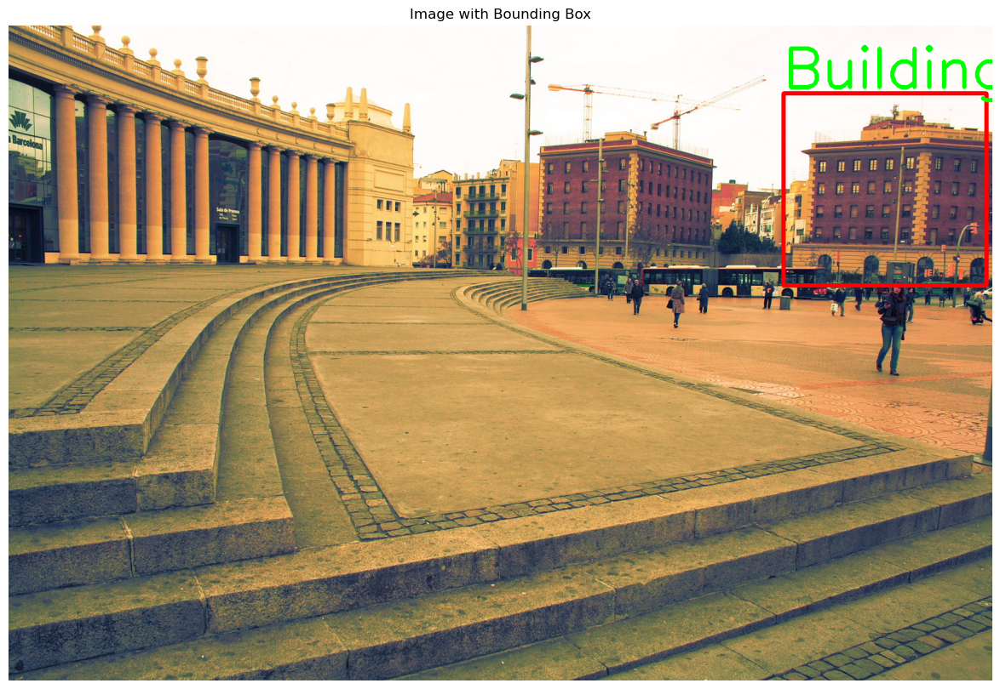

Image: (500, 700, 3)
Coordinates: (12, 97), (644, 365)


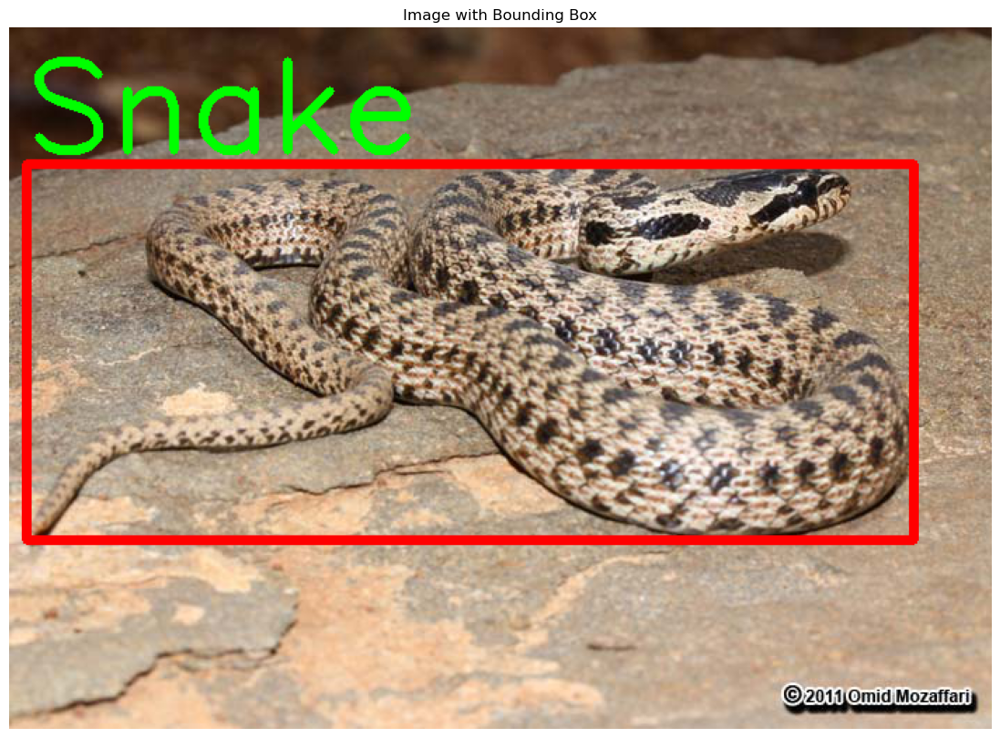

Image: (1944, 2592, 3)
Coordinates: (573, 285), (2159, 1624)


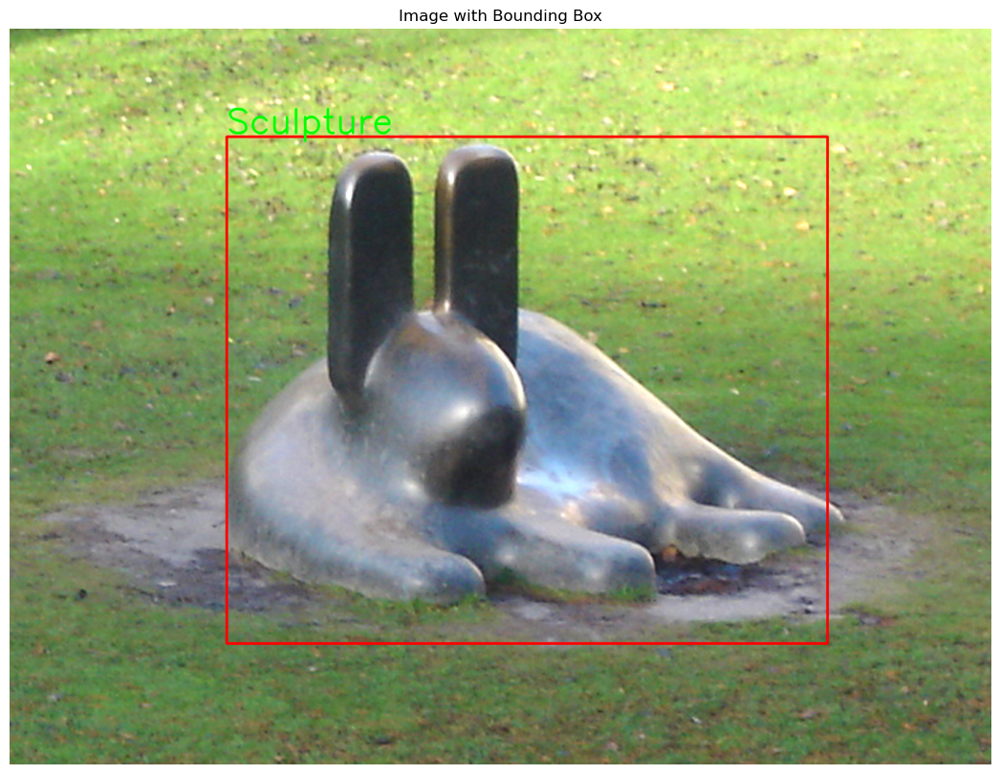

Image: (2522, 1891, 3)
Coordinates: (0, 0), (1018, 2372)


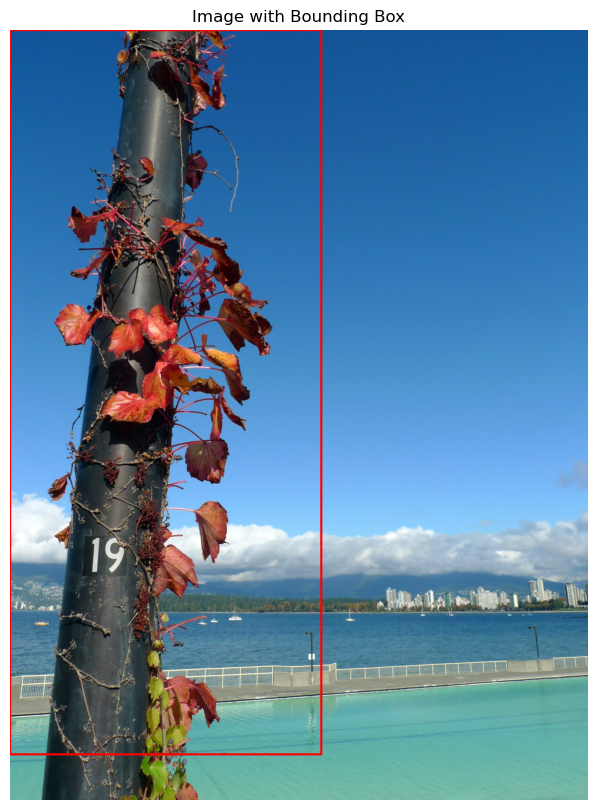

Image: (540, 720, 3)
Coordinates: (99, 50), (657, 432)


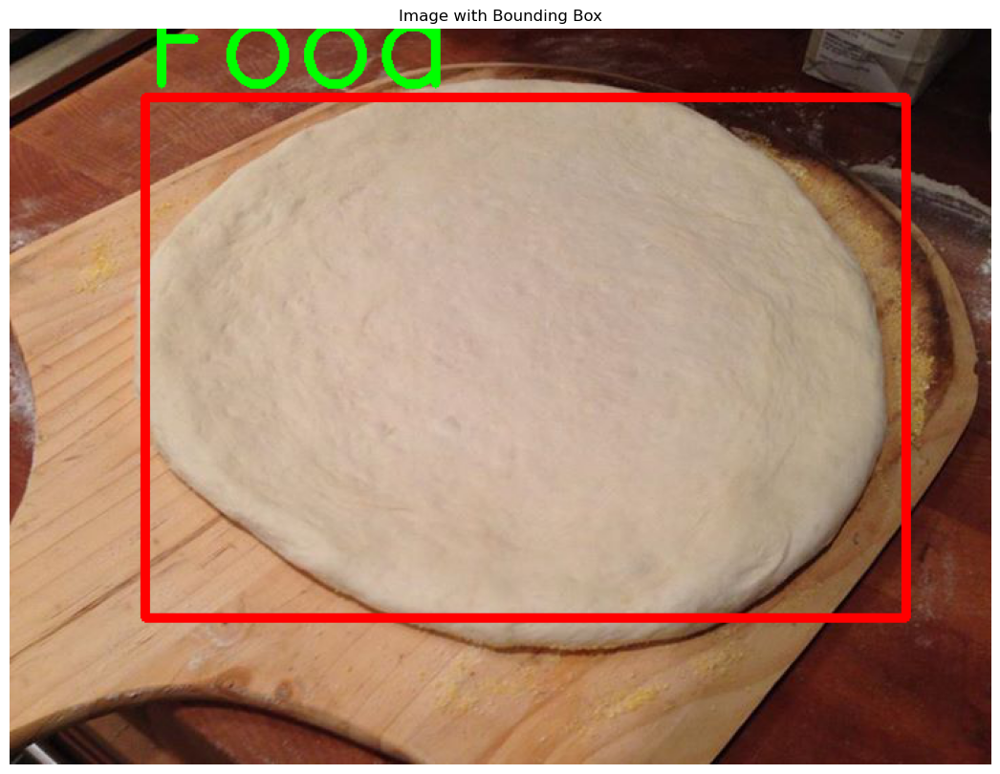

In [9]:
least_objects_img_ids = annotations_bbox["ImageID"].value_counts().tail(50).index.values

for img_id in random.sample(list(least_objects_img_ids), 5):
  plot_bbox(img_id)

In [10]:
class_descriptions[1].count()

601

In [11]:
# Find the label_name for 'Bed', 'Chair' and 'Table' classes
bed_pd = class_descriptions[class_descriptions[1]=='Bed']
chair_pd = class_descriptions[class_descriptions[1]=='Chair']
table_pd = class_descriptions[class_descriptions[1]=='Table']

In [12]:
bed_pd

,0,1
257,/m/03ssj5,Bed


In [13]:
label_name_bed = bed_pd[0].values[0]
label_name_chair = chair_pd[0].values[0]
label_name_table = table_pd[0].values[0]

label_name_bed

'/m/03ssj5'

In [14]:
bed_bbox = annotations_bbox[annotations_bbox['LabelName']==label_name_bed]
chair_bbox = annotations_bbox[annotations_bbox['LabelName']==label_name_chair]
table_bbox = annotations_bbox[annotations_bbox['LabelName']==label_name_table]

bed_bbox

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
5953,00041cc3701f7805,xclick,/m/03ssj5,1,0.135112,0.366609,0.420573,0.625000,1,0,0,0,0
5954,00041cc3701f7805,xclick,/m/03ssj5,1,0.179862,0.405336,0.436198,0.856771,0,0,0,0,0
9974,00074503ceae5131,xclick,/m/03ssj5,1,0.000000,0.999375,0.000000,0.999062,1,1,0,0,0
13671,000a54f1bdb96839,xclick,/m/03ssj5,1,0.000000,0.999167,0.028125,0.999375,0,1,0,0,0
17469,000da932ca7e68e4,xclick,/m/03ssj5,1,0.000000,0.753125,0.328330,0.993433,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14585203,ff7f55b7f6794f63,xclick,/m/03ssj5,1,0.000000,0.999375,0.000000,0.997500,1,1,0,0,0
14595452,ffb716498f082103,xclick,/m/03ssj5,1,0.180000,0.998750,0.309568,0.998124,0,0,0,0,0
14600295,ffce182988b6b746,xclick,/m/03ssj5,1,0.000000,0.305625,0.707317,0.999062,0,1,0,0,0
14602507,ffd718211ba34626,activemil,/m/03ssj5,1,0.006250,0.207500,0.373333,0.805000,1,1,0,0,0


In [15]:
print('There are %d beds in the dataset' %(len(bed_bbox)))
print('There are %d chairs in the dataset' %(len(chair_bbox)))
print('There are %d tables in the dataset' %(len(table_bbox)))

There are 3563 beds in the dataset
There are 132483 chairs in the dataset
There are 85691 tables in the dataset


In [16]:
bed_img_id = bed_bbox['ImageID']
chair_img_id = chair_bbox['ImageID']
table_img_id = table_bbox['ImageID']

In [17]:
# working on 10 images
n = 10
subbed_img_id = random.sample(list(bed_img_id), n)
subchair_img_id = random.sample(list(chair_img_id), n)
subtable_img_id = random.sample(list(table_img_id), n)

In [18]:
subbed_pd = images_boxable.loc[images_boxable['ImageID'].isin(subbed_img_id)]
subchair_pd = images_boxable.loc[images_boxable['ImageID'].isin(subchair_img_id)]
subtable_pd = images_boxable.loc[images_boxable['ImageID'].isin(subtable_img_id)]

In [19]:
print("Beds:",subbed_pd.shape, "Chair:", subchair_pd.shape, "Tables:", subtable_pd.shape)

Beds: (10, 12) Chair: (10, 12) Tables: (10, 12)


In [20]:
subbed_pd.head()

,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
122527,4c6a6c64b349db6a,train,https://c3.staticflickr.com/1/546/19883270948_...,https://www.flickr.com/photos/92793865@N07/198...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/ministeriodedefe...,Galeria del Ministerio de Defensa del Perú,OPERACIÓN CONJUNTA DE LAS FFAA Y PNP RECUPERAN...,3448148,Bj5AXfLtjIA4cqGMdJRqzA==,https://c4.staticflickr.com/1/546/19883270948_...,0.0
330148,de75ed924dc73bb8,train,https://c1.staticflickr.com/4/3094/3149713203_...,https://www.flickr.com/photos/ozzywu1974/31497...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/ozzywu1974/,Joe Wu,賊頭賊腦的媽,533686,SvXuamW/1C/8pt53c2uc0A==,https://c7.staticflickr.com/4/3094/3149713203_...,0.0
514710,c0529bc3bac9cb5a,train,https://c3.staticflickr.com/6/5019/5499068003_...,https://www.flickr.com/photos/gabuken/5499068003,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/gabuken/,Kenta Hayashi,奈良駅前のホテル着！ベッドひろーい！ 有料のエロ番組なんて見ないんだからねっ！早く寝て早朝か...,105208,3n6EwsJSzhUrkHOuo9oQxA==,https://c6.staticflickr.com/6/5019/5499068003_...,0.0
960985,79b3aa49801fd85f,train,https://c8.staticflickr.com/1/442/18554741578_...,https://www.flickr.com/photos/96223380@N02/185...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/96223380@N02/,Mighty Travels,Hotel Deal - Hyatt Raipur - $39,184524,357LMlCObdVdHQs2Y3E2gg==,https://c7.staticflickr.com/1/442/18554741578_...,0.0
993294,1da403d8ca992d5c,train,https://c5.staticflickr.com/1/22/34998350_69ed...,https://www.flickr.com/photos/jdiggans/34998350,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/jdiggans/,James Diggans,Our Monastic Cell,120872,rQoYlNg6DTHJcFQaWGwo/A==,https://c6.staticflickr.com/1/22/34998350_69ed...,0.0


In [21]:
subbed_dict = subbed_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()
subchair_dict = subchair_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()
subtable_dict = subtable_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()

In [22]:
mappings = [subbed_dict, subchair_dict, subtable_dict]

In [23]:
classes = ['Bed', 'Chair', 'Table']

In [24]:
for idx, obj_type in enumerate(classes):
  n_issues = 0
  print(obj_type)
  # create the directory
  if not os.path.exists(obj_type):
    os.mkdir(obj_type)
  for img_id, url in mappings[idx].items():
    try:
      img = io.imread(url)
      saved_path = os.path.join(obj_type, img_id+".jpg")
      io.imsave(saved_path, img)
    except Exception as e:
      n_issues += 1
  print(f"Images Issues: {n_issues}")

Bed
Images Issues: 3
Chair
Images Issues: 3
Table
Images Issues: 2


In [25]:
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)


Current working directory: C:\Users\User


In [ ]:
directory = "C:/Users/User/Bed"

In [28]:
# save images to train and test directory, so create 2 folders
train_path = 'train'
test_path = 'test'

In [29]:
for i in range(len(classes)):
    all_imgs = os.listdir(classes[i])
    all_imgs = [f for f in all_imgs if not f.startswith('.')]
    random.shuffle(all_imgs)
    
    limit = int(len(all_imgs)*0.8) # 80% data for training and 20% for testing

    train_imgs = all_imgs[:limit]
    test_imgs = all_imgs[limit:]
    
    for j in range(len(train_imgs)):
        original_path = os.path.join(classes[i], train_imgs[j])
        new_path = os.path.join(train_path, train_imgs[j])
        if os.path.exists(original_path):
            copyfile(original_path, new_path)
        
    
    for j in range(len(test_imgs)):
        original_path = os.path.join(classes[i], test_imgs[j])
        new_path = os.path.join(test_path, test_imgs[j])
        if os.path.exists(original_path):
            os.makedirs(os.path.dirname(new_path), exist_ok=True)
            copyfile(original_path, new_path)
    

In [30]:
train_img_count = os.listdir("C:/Users/User/Train")
print("Number of images in train found: ", len(train_img_count))

Number of images in train found:  71


In [31]:
label_names = [label_name_bed, label_name_chair, label_name_table]

train_df = pd.DataFrame(columns=['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName'])

# Find boxes in each image and put them in a dataframe
train_imgs = os.listdir(train_path)
train_imgs = [name for name in train_imgs if not name.startswith('.')]

for i in range(len(train_imgs)):
    sys.stdout.write('Parse train_imgs ' + str(i) + '; Number of boxes: ' + str(len(train_df)) + '\r')
    sys.stdout.flush()
    img_name = train_imgs[i]
    img_id = img_name[0:16]
    tmp_df = annotations_bbox[annotations_bbox['ImageID']==img_id]
    for index, row in tmp_df.iterrows():
        labelName = row['LabelName']
        for i in range(len(label_names)):
            if labelName == label_names[i]:
                train_df = train_df.append({'FileName': img_name, 
                                            'XMin': row['XMin'], 
                                            'XMax': row['XMax'], 
                                            'YMin': row['YMin'], 
                                            'YMax': row['YMax'], 
                                            'ClassName': classes[i]}, 
                                           ignore_index=True)

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2650445890.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_na

In [33]:
train_df.head()

,FileName,XMin,XMax,YMin,YMax,ClassName
0,00f03ff0eee0b5a3.jpg,0.166139,0.936709,0.084375,0.908750,Bed
1,01bf655eac166d06.jpg,0.004375,0.107500,0.766472,0.976647,Chair
2,01bf655eac166d06.jpg,0.078750,0.120000,0.753962,0.917431,Chair
3,01bf655eac166d06.jpg,0.099375,0.161250,0.737281,0.864053,Chair
4,01bf655eac166d06.jpg,0.146250,0.188750,0.728107,0.849041,Chair


Image: (3019, 2386, 3)
Coordinates: (228, 762), (551, 1988)
Coordinates: (345, 564), (602, 1100)
Coordinates: (458, 837), (1851, 1156)
Coordinates: (643, 532), (2238, 1109)
Coordinates: (396, 254), (2234, 2743)


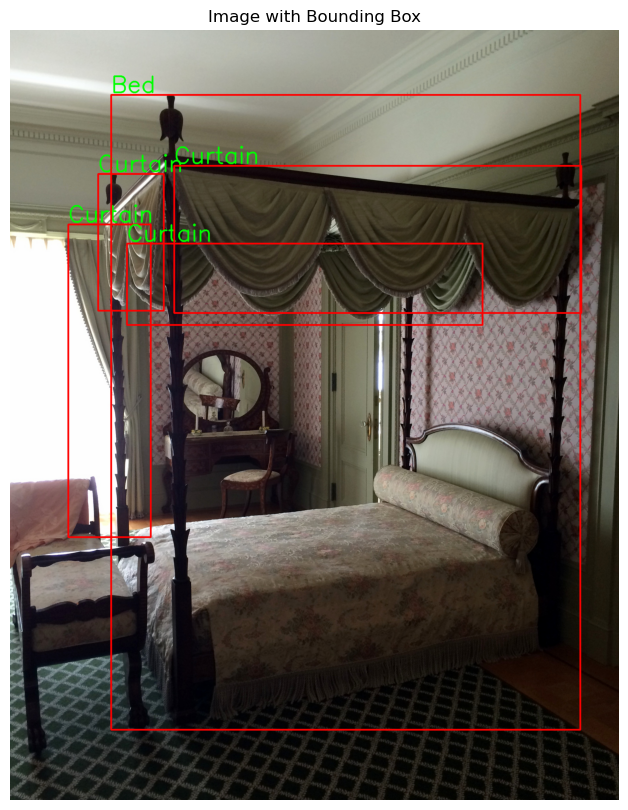

Image: (1676, 2236, 3)
Coordinates: (9, 1284), (240, 1636)
Coordinates: (809, 1308), (1449, 1625)
Coordinates: (176, 1263), (268, 1537)
Coordinates: (222, 1235), (360, 1448)
Coordinates: (327, 1220), (422, 1422)
Coordinates: (424, 1241), (563, 1448)
Coordinates: (546, 1217), (620, 1439)
Coordinates: (661, 1244), (807, 1498)
Coordinates: (761, 1347), (1059, 1667)
Coordinates: (802, 1232), (915, 1272)
Coordinates: (839, 1276), (1076, 1610)
Coordinates: (906, 1252), (1029, 1355)
Coordinates: (1039, 1220), (1145, 1353)
Coordinates: (1140, 1281), (1365, 1599)
Coordinates: (1165, 1350), (1454, 1674)


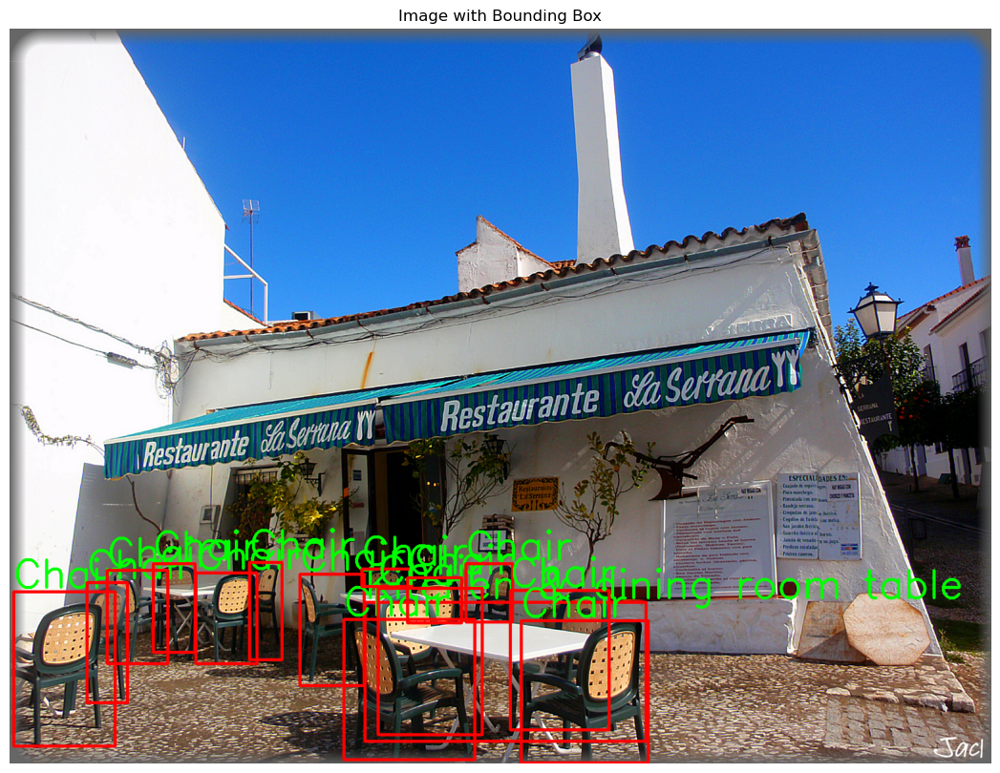

In [34]:
train_img_ids = train_df["FileName"].head().str.split(".").str[0].unique() # plotting the bounding box
for img_id in train_img_ids:
  plot_bbox(img_id)

In [35]:
val_df = pd.DataFrame(columns=['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName'])

test_df = pd.DataFrame(columns=['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName'])

# find boxes in each image and put them in a dataframe
test_imgs = os.listdir(test_path)
test_imgs = [name for name in test_imgs if not name.startswith('.')]

for i in range(len(test_imgs)):
    sys.stdout.write('Parse test_imgs ' + str(i) + '; Number of boxes: ' + str(len(test_df)) + '\r')
    sys.stdout.flush()
    img_name = test_imgs[i]
    img_id = img_name[0:16]
    tmp_df = annotations_bbox[annotations_bbox['ImageID']==img_id]
    for index, row in tmp_df.iterrows():
        labelName = row['LabelName']
        for i in range(len(label_names)):
            if labelName == label_names[i]:
                val_df = val_df.append({'FileName': img_name, 
                                            'XMin': row['XMin'], 
                                            'XMax': row['XMax'], 
                                            'YMin': row['YMin'], 
                                            'YMax': row['YMax'], 
                                            'ClassName': classes[i]}, 
                                           ignore_index=True)

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\User\AppData\Local\Temp\ipykernel_1212\2732706409.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\Use

In [36]:
train_df.to_csv('train.csv')
test_df.to_csv('test.csv')

In [68]:
X_new = np.array(train_df)
Y_new = np.array(test_df)

In [37]:
train_df = pd.read_csv('train.csv')

# for training
with open("annotation.txt", "w+") as f:
  for idx, row in train_df.iterrows():
      img = cv2.imread('train/' + row['FileName'])
      height, width = img.shape[:2]
      x1 = int(row['XMin'] * width)
      x2 = int(row['XMax'] * width)
      y1 = int(row['YMin'] * height)
      y2 = int(row['YMax'] * height)
      
      train_file_path = "C:/Users/User/Train"
      fileName = os.path.join(train_file_path, row['FileName'])
      className = row['ClassName']
      f.write(fileName + ',' + str(x1) + ',' + str(y1) + ',' + str(x2) + ',' + str(y2) + ',' + className + '\n')

In [38]:
test_df = pd.read_csv('test.csv')

# for test
with open("test_annotation.txt", "w+") as f:
  for idx, row in test_df.iterrows():
      sys.stdout.write(str(idx) + '\r')
      sys.stdout.flush()
      img = cv2.imread('test/' + row['FileName'])
      height, width = img.shape[:2]
      x1 = int(row['XMin'] * width)
      x2 = int(row['XMax'] * width)
      y1 = int(row['YMin'] * height)
      y2 = int(row['YMax'] * height)
      
      test_file_path = "C:/Users/User/test"
      fileName = os.path.join(test_file_path, row['FileName'])
      className = row['ClassName']
      f.write(fileName + ',' + str(x1) + ',' + str(y1) + ',' + str(x2) + ',' + str(y2) + ',' + className + '\n')